In [1]:
import requests
service_ids = []
# Collect all service names and IDs 
for page in range(1, 83):
    url = f"https://api.tosdr.org/service/v2/?page={page}"
    response = requests.get(url)
    data = response.json()
    for service in data["parameters"]["services"]:
        service_ids.append(service)
print(service_ids)

[{'id': 440, 'is_comprehensively_reviewed': False, 'name': 'pebble', 'updated_at': '2021-03-25T03:19:30.208Z', 'created_at': '2018-05-08T12:19:44.833Z', 'slug': 'pebble', 'rating': None, 'urls': ['pebble.com'], 'image': 'https://s3.tosdr.org/logos/440.png'}, {'id': 353, 'is_comprehensively_reviewed': False, 'name': 'Yammer', 'updated_at': '2021-03-31T01:04:42.630Z', 'created_at': '2018-05-08T12:19:43.120Z', 'slug': 'yammer', 'rating': None, 'urls': ['yammer.com'], 'image': 'https://s3.tosdr.org/logos/353.png'}, {'id': 2894, 'is_comprehensively_reviewed': False, 'name': 'Instapaper', 'updated_at': '2021-03-30T00:01:55.169Z', 'created_at': '2021-03-29T17:44:07.407Z', 'slug': 'instapaper', 'rating': None, 'urls': ['instapaper.com'], 'image': 'https://s3.tosdr.org/logos/2894.png'}, {'id': 3157, 'is_comprehensively_reviewed': False, 'name': 'UNRIC', 'updated_at': '2021-04-17T00:00:48.616Z', 'created_at': '2021-04-16T20:31:05.868Z', 'slug': 'unric', 'rating': None, 'urls': ['unric.org'], 'im

In [2]:
# Filter out services with no ratin
service_ids = [service for service in service_ids if service["rating"] != None]


In [3]:
data = []
for service in service_ids:
    response = requests.get(f"https://api.tosdr.org/service/v2/?id={service['id']}")
    data.append(response.json())
print(data)

[{'error': 256, 'message': 'OK', 'parameters': {'id': 1946, 'is_comprehensively_reviewed': True, 'name': 'Telegram', 'updated_at': '2021-07-10T12:33:34.512Z', 'created_at': '2019-10-28T13:27:25.649Z', 'slug': 'telegram', 'rating': 'B', 'urls': ['telegram.org', 'telegram.dog', 't.me'], 'image': 'https://s3.tosdr.org/logos/1946.png', 'documents': [{'id': 2060, 'name': 'FAQ', 'url': 'https://telegram.org/faq', 'updated_at': '2020-12-14T19:45:41.475Z', 'created_at': '2019-10-28T14:21:10.992Z'}, {'id': 2058, 'name': 'Privacy Policy', 'url': 'https://telegram.org/privacy', 'updated_at': '2021-06-16T13:10:44.370Z', 'created_at': '2019-10-28T13:33:06.428Z'}, {'id': 2059, 'name': 'Terms of Service', 'url': 'https://telegram.org/tos', 'updated_at': '2021-06-16T13:08:16.362Z', 'created_at': '2019-10-28T13:35:38.715Z'}], 'points': [{'id': 8859, 'title': 'This service keeps user logs for an undefined period of time', 'source': 'https://telegram.org/privacy', 'status': 'declined', 'analysis': 'Gener

In [10]:
with open("services.txt", "w+", encoding="utf-8") as f:
    f.writelines([str(service) + "\n" for service in data])

479
{'A': 41, 'B': 73, 'C': 96, 'D': 142, 'E': 127}


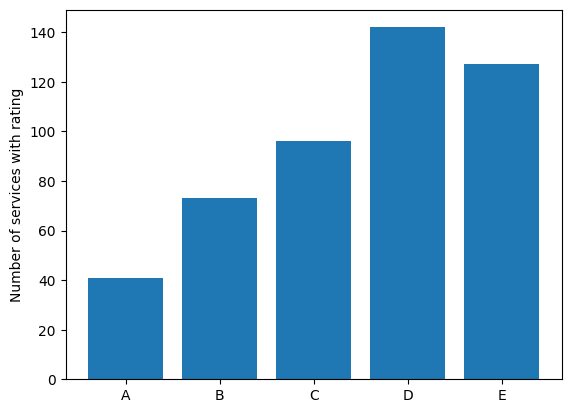

In [4]:
import matplotlib.pyplot as plt
# Dataset exploration
# Distribution of classes
classes = {"A": 0, "B": 0, "C": 0, "D": 0, "E": 0}
print(len(data))
for service in data:
    classes[service["parameters"]["rating"]] += 1
print(classes)
classes_x = list(classes.keys())
classes_y = list(classes.values())
plt.bar(classes_x, classes_y)
plt.ylabel("Number of services with rating")
plt.show()
    

In [5]:
import json
print(json.dumps(data[3]))

{"error": 256, "message": "OK", "parameters": {"id": 230, "is_comprehensively_reviewed": true, "name": "PayPal", "updated_at": "2023-07-10T22:00:22.632Z", "created_at": "2018-01-16T15:26:06.469Z", "slug": "paypal", "rating": "E", "urls": ["paypal.com", "paypal-corp.com", "paypal.me", "paypalobjects.com", "paypal-gifts.com", "paypal-communication.com", "epl.paypal-communication.com"], "image": "https://s3.tosdr.org/logos/230.png", "documents": [{"id": 158, "name": "Privacy Policy", "url": "https://www.paypal.com/us/webapps/mpp/ua/privacy-full", "updated_at": "2020-12-14T14:00:47.434Z", "created_at": "2018-07-17T10:11:49.170Z"}, {"id": 368, "name": "User Agreement (EU)", "url": "https://www.paypal.com/nl/webapps/mpp/ua/useragreement-full?locale.x=en_NL", "updated_at": "2020-12-14T15:54:14.444Z", "created_at": "2018-08-24T12:35:14.552Z"}, {"id": 1288, "name": "Ebay Billing Agreement ", "url": "https://www.paypal.com/sg/webapps/mpp/ua/ebaybilling-full", "updated_at": "2019-05-12T22:28:11.9